#Insulation Detection


In [ ]:
!python --version

Python 3.7.11


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

Start Cascade

In [ ]:
imgCascade =  cv2.CascadeClassifier("/content/insulation1.xml")

In [ ]:
def insulator_detect(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    insulator = imgCascade.detectMultiScale(gray,1.2,20)
    print(insulator)
    for (x,y,w,h) in insulator :
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
        cv2.putText(img,"Insulator",(x,y-4),cv2.FONT_HERSHEY_SIMPLEX,0.8,(0,255,0),2)
    return img

In [ ]:
image = cv2.imread("/content/Test1.jpg")

In [ ]:
#image1 = cv2.imread("/content/Test2.jpgg")

In [ ]:
image = insulator_detect(image)

[[114 267 144 144]
 [606 323 195 195]]


In [ ]:
#image1 = insulator_detect(image1)

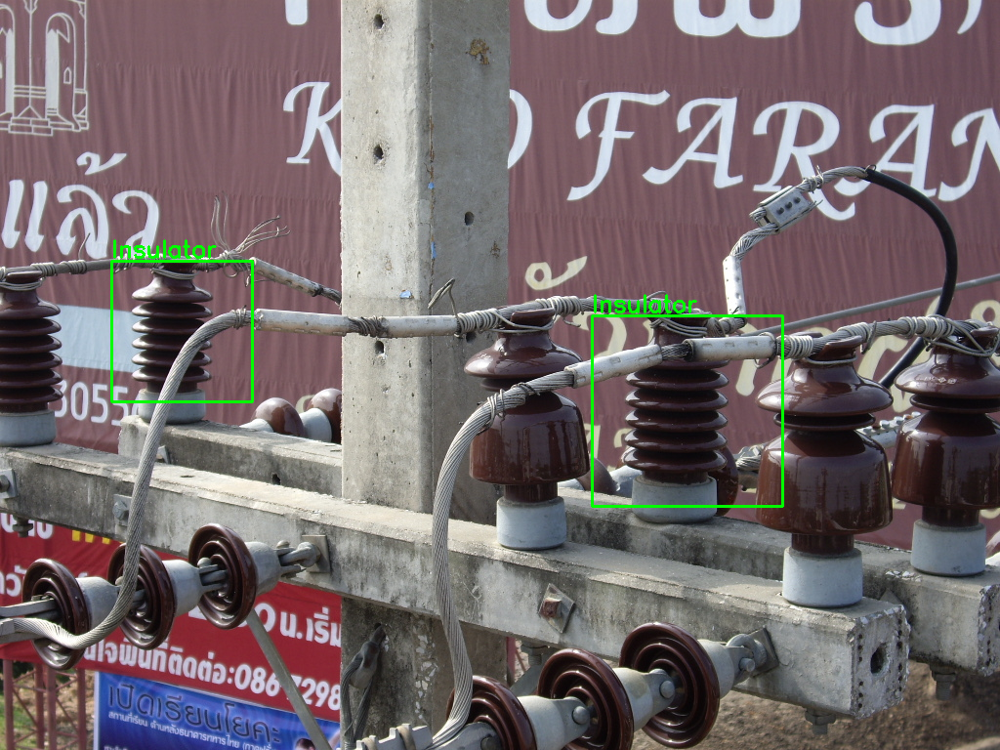

In [ ]:
cv2_imshow(image)

In [ ]:
image = cv2.imread("/content/Test2.jpg")

In [ ]:
image = insulator_detect(image)

[[751 319 237 237]
 [175 380 208 208]]


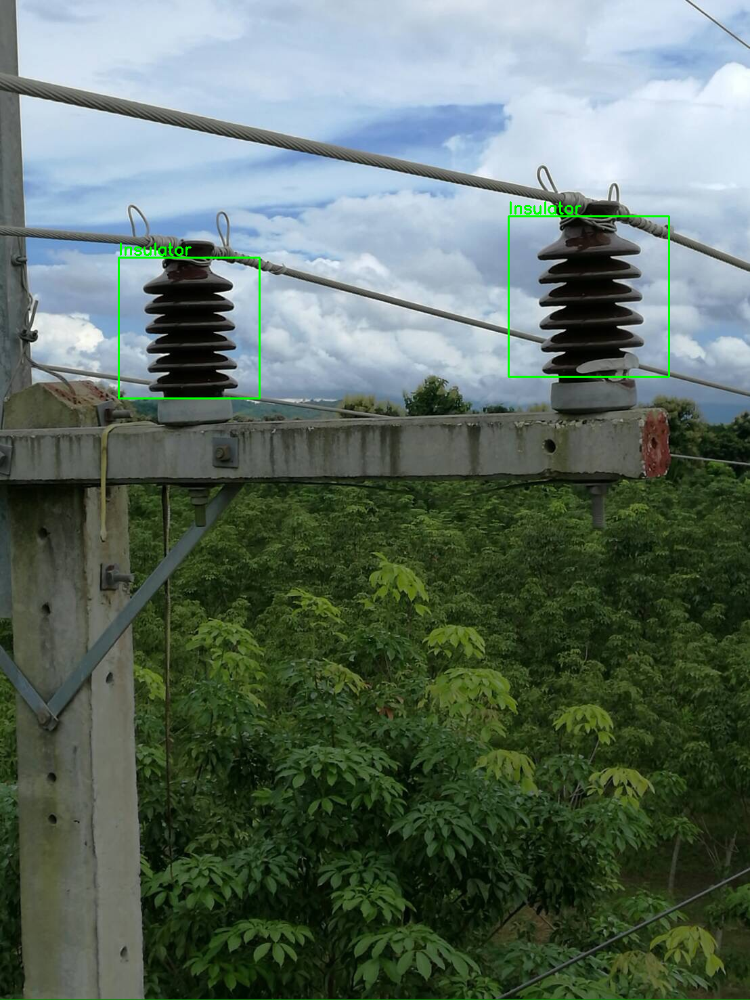

In [ ]:
cv2_imshow(image)

#Insulation Regconition

In [ ]:
!wget https://www.dropbox.com/sh/kbjczi8qzdu0vv6/AADZkB03ENdxmswS-qCT_JpHa?dl=0 -O SVCtrainlib.zip

--2021-09-16 00:30:19--  https://www.dropbox.com/sh/kbjczi8qzdu0vv6/AADZkB03ENdxmswS-qCT_JpHa?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6030:18::a27d:5012
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /sh/raw/kbjczi8qzdu0vv6/AADZkB03ENdxmswS-qCT_JpHa [following]
--2021-09-16 00:30:19--  https://www.dropbox.com/sh/raw/kbjczi8qzdu0vv6/AADZkB03ENdxmswS-qCT_JpHa
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc7828450cef1a2d57a47540305.dl.dropboxusercontent.com/zip_download_get/A5pQNgZtgjT61XsLVIvPRa7NKW9KMYfcVt5oBsNmu2DiWXHFdhvC8Ngu0_sDkCUGt7XOWEYMWJSYGzBNyHCr3thnVTUEAp4IWyD3H_Cae57wmg# [following]
--2021-09-16 00:30:19--  https://ucc7828450cef1a2d57a47540305.dl.dropboxusercontent.com/zip_download_get/A5pQNgZtgjT61XsLVIvPRa7NKW9KMYfcVt5oBsNmu2DiWXHFdhvC8Ngu0_sDkCUGt7XOWEYMWJSYGzB

In [ ]:
!unzip /content/SVCtrainlib.zip -d  /content/SVCtrainlib

Archive:  /content/SVCtrainlib.zip
mapname:  conversion of  failed
replace /content/SVCtrainlib/Good/pic.1.2.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
 extracting: /content/SVCtrainlib/Good/pic.1.2.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.4.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.1.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.3.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.5.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.8.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.7.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.6.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.13.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.17.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.15.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.11.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.10.jpg  
 extracting: /content/SVCtrainlib/Good/pic.1.16.jpg  
 extracting: /content/SVCtrainlib/Defect/pic.2.5.jpg  
 extracting: /content/SVCtrainlib/Defect/pi

In [ ]:
#!unzip -o -q /content/SVCtrainlib.zip

In [ ]:
import numpy as np
import os
import cv2
from joblib import dump,load
from sklearn.svm import SVC
from imutils import paths

Training model with SVM

In [ ]:
imagePaths = list(paths.list_images("SVCtrainlib"))
data = []
labels = []
#print(imagePaths)

for imagePath in imagePaths:
	label = imagePath.split(os.path.sep)[-2]
	print(label)
	if label == "Good":
		label = 0
	else :
		label = 1
	image = cv2.imread(imagePath)
	resized = cv2.resize(image,(64,64),interpolation=cv2.INTER_LINEAR)
	gray = cv2.cvtColor(resized,cv2.COLOR_BGR2GRAY)
	data.append(np.ravel(gray))
	labels.append(label)

	
labels = np.array(labels)
clf = SVC(kernel='linear',probability=True)
clf.fit(data,labels)
dump(clf,"Insulatorsvmclassifier.lib")
print("Train Sucess") 

Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Good
Defect
Defect
Defect
Defect
Defect
Defect
Defect
Defect
Defect
Train Sucess


In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
insulatorCascades = cv2.CascadeClassifier("/content/insulation1.xml")
svmClassifier = load("/content/Insulatorsvmclassifier.lib")

In [ ]:
def insulator_detect(img,clf):
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  insulator = insulatorCascades.detectMultiScale(gray,1.2,15)
  text = "None"
  for (x,y,w,h) in insulator:
    insulatorset = []
    insulator = gray[y:y+h,x:x+w]
    insulator_resized = cv2.resize(insulator,(64,64),interpolation=cv2.INTER_LINEAR)
    insulatorset.append(np.ravel(insulator_resized))
    pred = clf.predict(insulatorset)
    prob = clf.predict_proba(insulatorset)
    print(pred,prob)
    if pred == [0]:
      text = "Good"
    elif pred == [1]:
      text = "Defect"
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
    cv2.putText(img,text,(x,y-4),cv2.FONT_HERSHEY_SIMPLEX,0.8,(0,0,255),2)
  return img


In [ ]:
image = cv2.imread("/content/Test1.jpg")
image = insulator_detect(image,svmClassifier)

[1] [[0.7909854 0.2090146]]
[0] [[0.41480728 0.58519272]]
[0] [[0.52322251 0.47677749]]


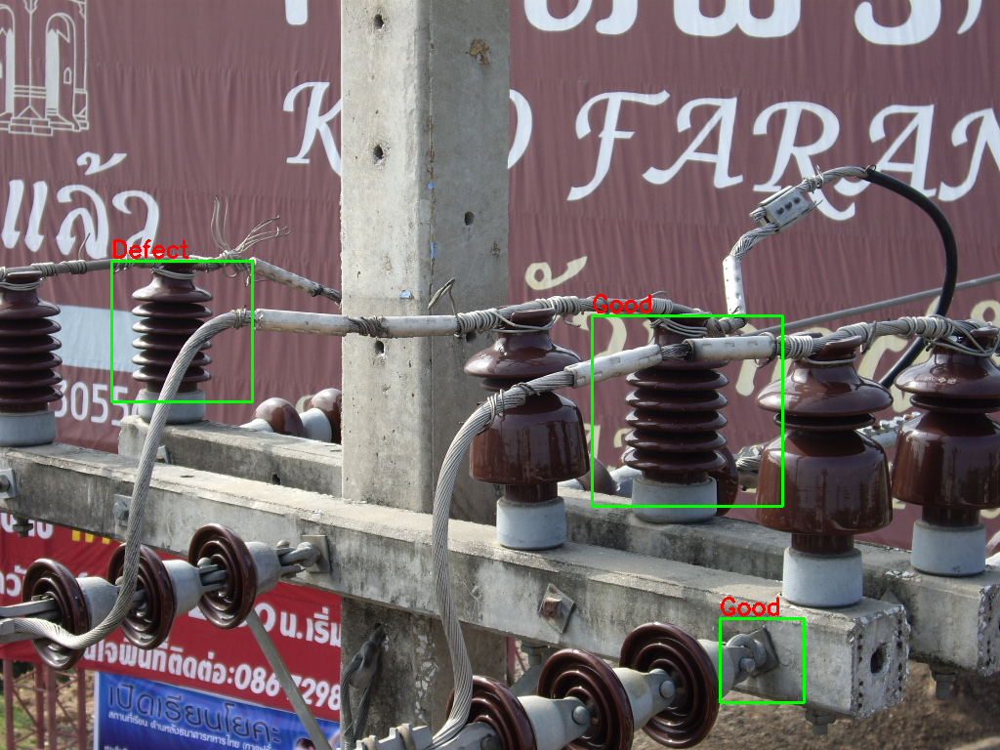

In [ ]:
cv2_imshow(image)

[1] [[0.71573096 0.28426904]]
[0] [[0.62499083 0.37500917]]
[0] [[0.47552086 0.52447914]]
[0] [[0.49276889 0.50723111]]


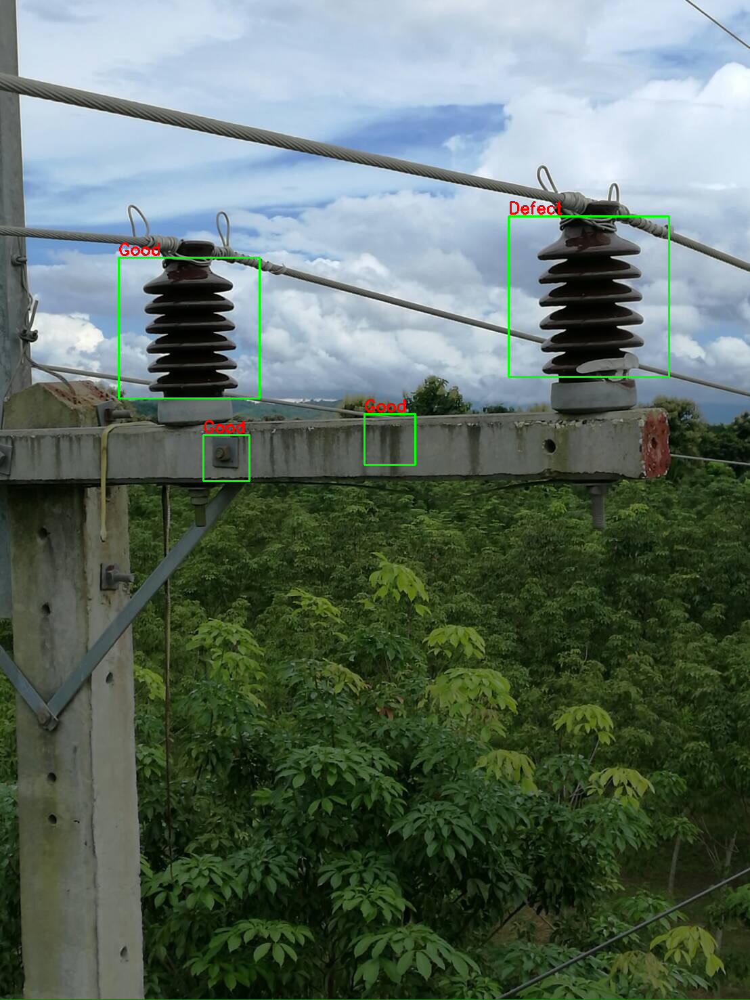

In [ ]:
image = cv2.imread("/content/Test2.jpg")
image = insulator_detect(image,svmClassifier)
cv2_imshow(image)

[0] [[0.66259085 0.33740915]]
[1] [[0.8257918 0.1742082]]


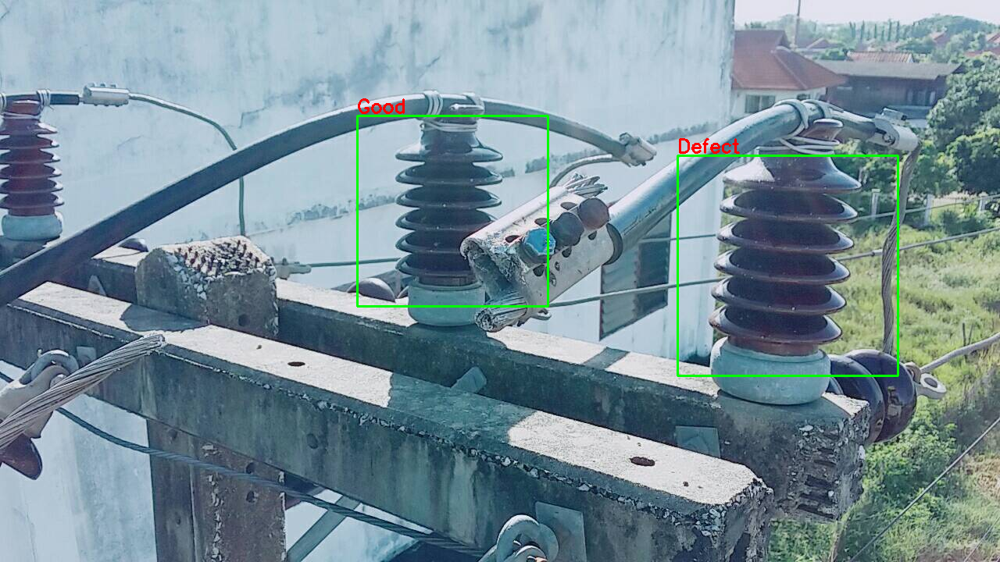

In [ ]:
image = cv2.imread("/content/Test3.jpg")
image = insulator_detect(image,svmClassifier)
cv2_imshow(image)

[0] [[0.65635274 0.34364726]]
[0] [[0.52189406 0.47810594]]


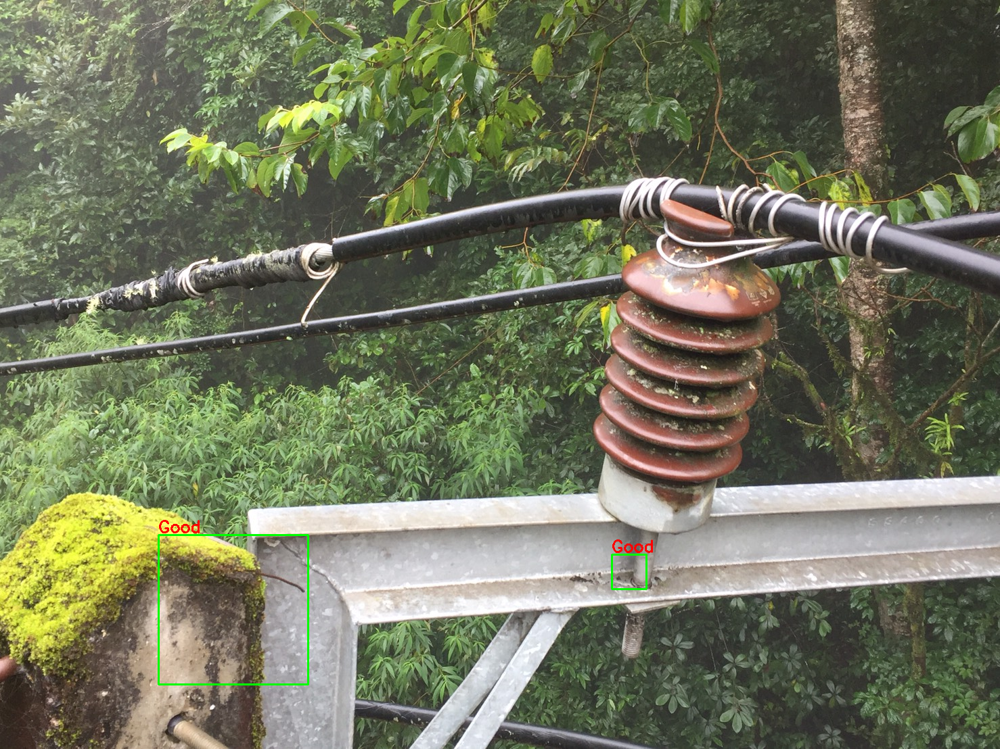

In [ ]:
image = cv2.imread("/content/Test4.jpg")
image = insulator_detect(image,svmClassifier)
cv2_imshow(image)